In [1]:
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import h5py
import PIL.Image
from scipy import stats
from itertools import chain
from scipy.io import loadmat

import torch

# from neurogen.models.resnet import MyResnet
import neurogen.numpy_utility as pnu
from neurogen.plots import display_candidate_loss
from neurogen.file_utility import save_stuff, flatten_dict, embed_dict
from neurogen.torch_fwrf import get_value

from neurogen.torch_fwrf import learn_params_ridge_regression, get_predictions, Torch_fwRF_voxel_block
from neurogen.encoding import load_encoding
from neurogen.visualize import center_crop

In [2]:
#paths
nsd_root = "data/nsd/"
meanROIbeta_root = nsd_root + "roiavgbeta_neurogen/"
# weight_root = "neurogen/output/"

weight_base_dir = "/home/hhan228/memorability/Willow/neurogen_output/"
# weight_root = weight_base_dir + "alexnet/"
weight_root = weight_base_dir + "resnet/"

save_base_dir = "data/representation_analysis/" 
# save_dir = save_base_dir + "alexnet/"
save_dir = save_base_dir + "resnet/"

exp_design_file = nsd_root + "nsd_expdesign.mat"
stim_file = nsd_root + "shared1000_original.npy"

In [3]:
device = torch.device("cuda:1")
# model_name = "alexnet"
model_name = "resnet"

In [4]:
ctrld_dir = "data/memorability_controlled_test_70p/"
high_imgs = sorted([f for f in os.listdir(ctrld_dir+"increased/") if os.path.isfile(os.path.join(ctrld_dir+"increased/", f))])
low_imgs = sorted([f for f in os.listdir(ctrld_dir+"decreased/") if os.path.isfile(os.path.join(ctrld_dir+"decreased/", f))])
regen_imgs = sorted([f for f in os.listdir(ctrld_dir+"regen/") if os.path.isfile(os.path.join(ctrld_dir+"regen/", f))])

In [5]:
animals = """
9: ostrich, Struthio camelus
11: goldfinch, Carduelis carduelis
13: junco, snowbird
92: bee eater
99: goose
101: tusker
132: American egret, great white heron, Egretta albus
142: dowitcher
146: albatross, mollymawk
207: golden retriever
249: malamute, malemute, Alaskan malamute
276: hyena, hyaena
281: tabby, tabby cat
285: Egyptian cat
293: cheetah, chetah, Acinonyx jubatus
294: brown bear, bruin, Ursus arctos
295: American black bear, black bear, Ursus americanus, Euarctos americanus
296: ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus
339: sorrel
340: zebra
345: ox
346: water buffalo, water ox, Asiatic buffalo, Bubalus bubalis
348: ram, tup
351: hartebeest
353: gazelle
354: Arabian camel, dromedary, Camelus dromedarius
355: llama
385: Indian elephant, Elephas maximus
386: African elephant, Loxodonta africana
"""
animal_classes = sorted([int(e.split(': ')[0]) for e in animals.strip().split('\n')])

foods = """
931: bagel, beigel
934: hotdog, hot dog, red hot
937: broccoli
938: cauliflower
943: cucumber, cuke
948: Granny Smith
950: orange
954: banana
962: meat loaf, meatloaf
963: pizza, pizza pie
965: burrito
"""
food_classes = sorted([int(e.split(': ')[0]) for e in foods.strip().split('\n')])

landscapes = """
460: breakwater, groin, groyne, mole, bulwark, seawall, jetty
497: church, church building
663: monastery
582: grocery store, grocery, food market, market
698: palace
706: patio, terrace
718: pier
975: lakeside, lakeshore
977: sandbar, sand bar
978: seashore, coast, seacoast, sea-coast
970: alp
"""
landscape_classes = sorted([int(e.split(': ')[0]) for e in landscapes.strip().split('\n')])

sports = """
795: ski
981: ballplayer, baseball player
472: canoe
"""
sports_classes = sorted([int(e.split(': ')[0]) for e in sports.strip().split('\n')])

vehicles = """
555: fire engine, fire truck
565: freight car
569: garbage truck, dustcart
603: horse cart, horse-cart
654: minibus
656: minivan
664: monitor
665: moped
670: motor scooter, scooter
671: mountain bike, all-terrain bike, off-roader
717: pickup, pickup truck
705: passenger car, coach, carriage
779: school bus
814: speedboat
829: streetcar, tram, tramcar, trolley, trolley car
895: warplane, military plane
693: paddle, boat paddle
870: tricycle, trike, velocipede
874: trolleybus, trolley coach, trackless trolley
880: unicycle, monocycle
730: plow, plough
404: airliner
484: catamaran
547: electric locomotive
820: steam locomotive
"""
vehicle_classes = sorted([int(e.split(': ')[0]) for e in vehicles.strip().split('\n')])

In [6]:
default_ROIs = [
    'OFA', 'FFA1', 'FFA2', 'mTLfaces', 'aTLfaces',
    'EBA', 'FBA1', 'FBA2', 'mTLbodies',
    'OPA', 'PPA', 'RSC',
    # 'OWFA', 'VWFA1', 'VWFA2', 'mfswords', 'mTLwords', 
    'V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4',
    'L-hippocampus', 'L-amygdala', 'R-hippocampus', 'R-amygdala'
]

ctrld_nids = [14, 19, 24, 40, 53, 57, 79, 84, 86, 88, 89, 90, 113, 117, 147, 154, 157, 162, 166, 168, 170, 173, 175, 179, 181, 183, 185, 188, 200, 201, 205, 215, 217, 230, 231, 242, 246, 250, 255, 256, 275, 281, 283, 296, 310, 315, 317, 329, 330, 333, 347, 349, 351, 355, 366, 374, 383, 386, 390, 396, 400, 402, 403, 407, 419, 430, 446, 448, 452, 456, 460, 471, 492, 502, 506, 513, 526, 528, 530, 532, 540, 556, 557, 562, 566, 571, 592, 593, 620, 622, 625, 626, 628, 631, 632, 639, 643, 644, 646, 649, 651, 657, 680, 682, 686, 689, 692, 705, 723, 728, 731, 738, 745, 749, 754, 757, 758, 766, 767, 778, 782, 785, 807, 825, 828, 829, 834, 850, 852, 858, 860, 867, 868, 873, 883, 893, 898, 914, 927, 934, 940, 944, 945, 955, 959, 964, 975, 979, 982, 994, 996, 999]

savearg = {'format':'png', 'dpi': 120, 'facecolor': None}

# number of trials for all subjects
trials = np.array([30000, 30000, 24000, 22500, 30000, 24000, 30000, 22500])

## DNN-DNN

In [7]:
category_nids = {"animals": [], "foods": [], "landscapes": [], "sports": [], "vehicles": [],  "etc": []}
for rimg in regen_imgs:
    nid = int(rimg.split('_')[0].split('shared')[-1])-1
    if nid in ctrld_nids:
        class_id = int(rimg.split('_')[1].split('class')[-1])
        if class_id in animal_classes:
            category_nids["animals"].append(nid)
        elif class_id in food_classes:
            category_nids["foods"].append(nid)
        elif class_id in landscape_classes:
            category_nids["landscapes"].append(nid)
        elif class_id in sports_classes:
            category_nids["sports"].append(nid)
        elif class_id in vehicle_classes:
            category_nids["vehicles"].append(nid)
        else:
            category_nids["etc"].append(nid)
    else:
        continue

In [8]:
sampled_nids = {}
print("counts")
for k in category_nids.keys():
    print(f"{k}: {len(category_nids[k])}")
    np.random.seed(42)
    sampled_nids[k] = list(np.random.choice(category_nids[k], 3, replace=False))

print("\nsampled")
print(sampled_nids)

counts
animals: 27
foods: 5
landscapes: 7
sports: 22
vehicles: 31
etc: 60

sampled
{'animals': [383, 566, 403], 'foods': [310, 944, 639], 'landscapes': [14, 242, 626], 'sports': [117, 686, 456], 'vehicles': [873, 460, 828], 'etc': [19, 88, 622]}


In [8]:
# parameters
subject = 5

# subj_dir = ctrld_dir+f"subj{subject:02d}/"
subj_dir = ctrld_dir+f"including_memory/resnet/subj{subject:02d}/"
os.makedirs(subj_dir, exist_ok=True)

In [9]:
# load behavior data

exp_design = loadmat(exp_design_file)
# order of image id in trials
ordering = exp_design['masterordering'].flatten() - 1 # zero-indexed ordering of indices (matlab-like to python-like)
print('ordering shape', ordering.shape)
# image id for each subject
subject_idx  = exp_design['subjectim']
print('subject_idx shape', subject_idx.shape)
# shared image id
shared_idx = exp_design['sharedix']

ordering shape (30000,)
subject_idx shape (8, 10000)


In [10]:
image_data = np.load("data/nsd/shared1000_227.npy")
image_data = image_data.astype(np.float32) / 255.

print('image data shape', image_data.shape)

image data shape (1000, 3, 227, 227)


In [11]:
data_size = trials[subject-1]
ordering_data = ordering[:data_size]
print(ordering_data.shape)

(30000,)


In [12]:
roi_num = len(default_ROIs)
roi_data = np.zeros([data_size, roi_num])
n = 0
del_idx = []
for roi in default_ROIs:
    roi_data[:,n] = np.genfromtxt(meanROIbeta_root + f'subj{subject:02d}/meanbeta_' + roi + '.txt')
    if np.isnan(np.sum(roi_data[:,n])):
        print(roi)
        del_idx.append(n)
    n += 1

ROIs_bool = np.ones((23,1), dtype='bool')
ROIs_bool[del_idx] = False

roi_data = np.delete(roi_data, del_idx, axis=1)

### Original images: real activations

In [13]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [14]:
# plt.imshow(np.expand_dims(image_data[ctrld_nids[0]], axis=0)[0].transpose(1, 2, 0))

In [15]:
img_indices = sampled_nids["animals"]+sampled_nids["foods"]+sampled_nids["landscapes"]+sampled_nids["sports"]+sampled_nids["vehicles"]
sampled_image_data = image_data[img_indices]
sampled_image_data.shape

(15, 3, 227, 227)

In [16]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:14   ] of 15, voxels [     0:22    ] of 23
---------------------------------------
total time = 0.021655s
sample throughput = 0.001444s/sample
voxel throughput = 0.000942s/voxel


(15, 23)

In [17]:
outputs = {}
rdms_dnn = {}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    rdms_dnn[k] = np.full((15, 15), np.nan)

MaxPool2d_0: (15, 64, 57, 57)
ReLU_1: (15, 64, 57, 57)
ReLU_2: (15, 64, 57, 57)
ReLU_3: (15, 128, 29, 29)
ReLU_4: (15, 128, 29, 29)
ReLU_5: (15, 256, 15, 15)
ReLU_6: (15, 256, 15, 15)
ReLU_7: (15, 512, 8, 8)
ReLU_8: (15, 512, 8, 8)
AdaptiveAvgPool2d_9: (15, 512, 1, 1)
Linear_10: (15, 1000)


In [18]:
# euclidean distance
for k, rdm in rdms_dnn.items():
    for i in range(15):
        i_concat = np.vstack([
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0)
        ])
        for j in range(15):  
            j_concat = np.vstack([
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0)
            ])
            rdm[i][j] = np.linalg.norm(i_concat-j_concat)

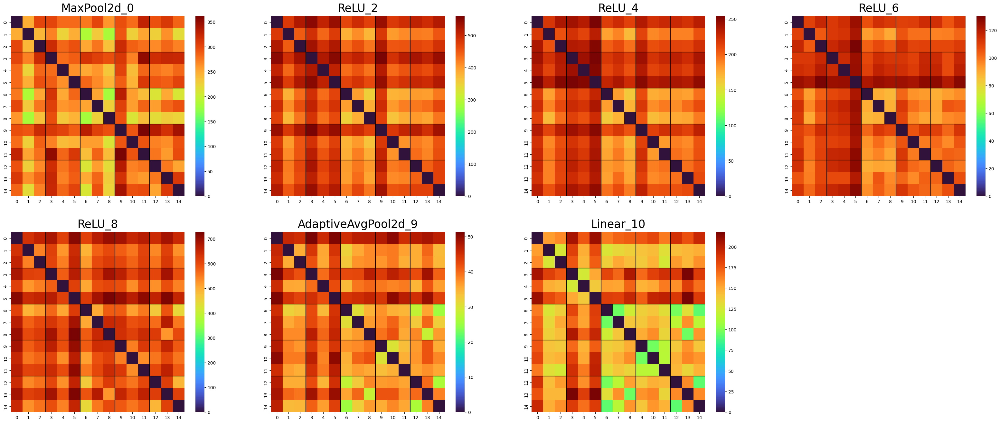

In [19]:
dnn_keys = ['MaxPool2d_0', 'ReLU_2', 'ReLU_4', 'ReLU_6', 'ReLU_8', 'AdaptiveAvgPool2d_9', 'Linear_10']
fig_pos = [(i, j) for i in range(2) for j in range(4)][:-1]
plt.figure(figsize=(40, 16))

for k, pos in zip(dnn_keys, fig_pos):
    ax = plt.subplot2grid((2,4), pos)
    sns.heatmap(rdms_dnn[k], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(k, fontsize=25, pad=10)

In [20]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {}
for roi in ROIs:
    rdms_roi[roi] = np.full((15, 15), np.nan)

In [21]:
for k, rdm in rdms_roi.items():
    roi_idx = list(ROIs).index(k)
    for i, i_img_idx in enumerate(img_indices):
        i_sampled_roi = roi_data[np.in1d(ordering_data, i_img_idx)][:, roi_idx]
        for j, j_img_idx in enumerate(img_indices):
            j_sampled_roi = roi_data[np.in1d(ordering_data, j_img_idx)][:, roi_idx]
            rdm[i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)

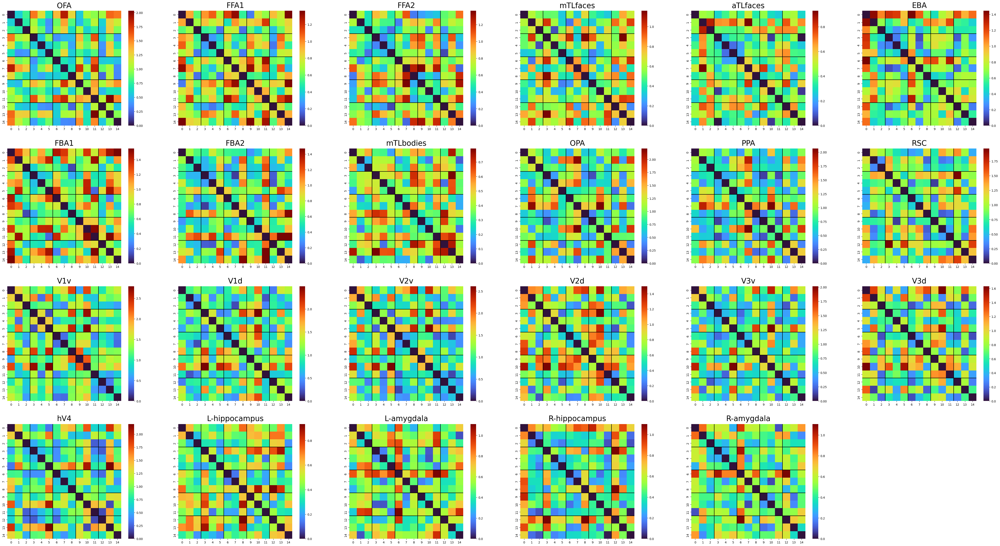

In [22]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]
plt.figure(figsize=(60, 32))

for roi, pos in zip(ROIs, fig_pos):
    ax = plt.subplot2grid((4,6), pos)
    sns.heatmap(rdms_roi[roi], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(roi, fontsize=25, pad=10)

In [23]:
df_dict = {"memorability_modified": [], "ROI": [], "DNN_layer": [], "spearman_corr_coef": [], "p_value": []}
for k_roi in rdms_roi.keys():
    upper_tri_indices = np.triu_indices_from(rdms_roi[k_roi], k=1)
    rdm_roi = rdms_roi[k_roi][upper_tri_indices]
    for k_dnn in dnn_keys:
        upper_tri_indices = np.triu_indices_from(rdms_dnn[k_dnn], k=1)
        rdm_dnn = rdms_dnn[k_dnn][upper_tri_indices]
        corr_coef, p_value = stats.spearmanr(rdm_roi, rdm_dnn)
        
        df_dict["memorability_modified"].append("original_brain")
        df_dict["ROI"].append(k_roi)
        df_dict["DNN_layer"].append(k_dnn)
        df_dict["spearman_corr_coef"].append(corr_coef)
        df_dict["p_value"].append(p_value)

### Original images: predicted activations

In [24]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [25]:
# plt.imshow(np.expand_dims(image_data[ctrld_nids[0]], axis=0)[0].transpose(1, 2, 0))

In [26]:
img_indices = sampled_nids["animals"]+sampled_nids["foods"]+sampled_nids["landscapes"]+sampled_nids["sports"]+sampled_nids["vehicles"]
sampled_image_data = image_data[img_indices]
sampled_image_data.shape

(15, 3, 227, 227)

In [27]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:14   ] of 15, voxels [     0:22    ] of 23
---------------------------------------
total time = 0.023827s
sample throughput = 0.001588s/sample
voxel throughput = 0.001036s/voxel


(15, 23)

In [28]:
outputs = {}
rdms_dnn = {}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    rdms_dnn[k] = np.full((15, 15), np.nan)

MaxPool2d_0: (15, 64, 57, 57)
ReLU_1: (15, 64, 57, 57)
ReLU_2: (15, 64, 57, 57)
ReLU_3: (15, 128, 29, 29)
ReLU_4: (15, 128, 29, 29)
ReLU_5: (15, 256, 15, 15)
ReLU_6: (15, 256, 15, 15)
ReLU_7: (15, 512, 8, 8)
ReLU_8: (15, 512, 8, 8)
AdaptiveAvgPool2d_9: (15, 512, 1, 1)
Linear_10: (15, 1000)


In [29]:
# euclidean distance
for k, rdm in rdms_dnn.items():
    for i in range(15):
        i_concat = np.vstack([
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0)
        ])
        for j in range(15):  
            j_concat = np.vstack([
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0)
            ])
            rdm[i][j] = np.linalg.norm(i_concat-j_concat)

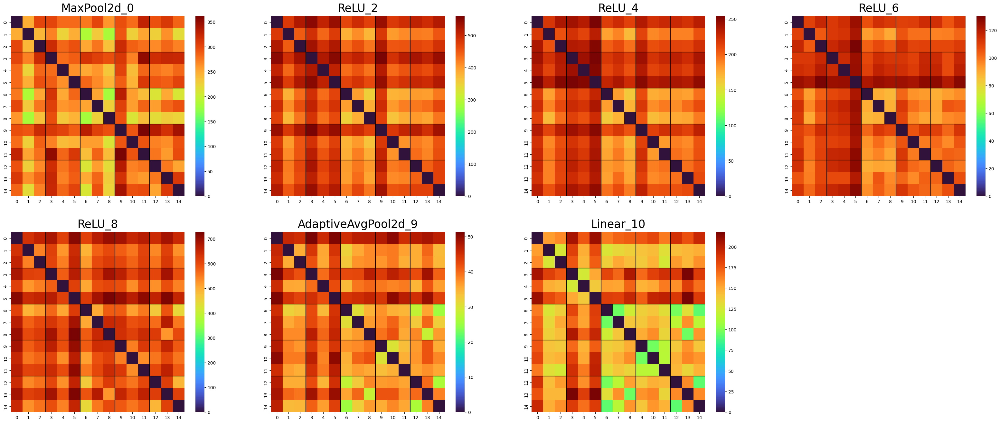

In [30]:
dnn_keys = ['MaxPool2d_0', 'ReLU_2', 'ReLU_4', 'ReLU_6', 'ReLU_8', 'AdaptiveAvgPool2d_9', 'Linear_10']
fig_pos = [(i, j) for i in range(2) for j in range(4)][:-1]
plt.figure(figsize=(40, 16))

for k, pos in zip(dnn_keys, fig_pos):
    ax = plt.subplot2grid((2,4), pos)
    sns.heatmap(rdms_dnn[k], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(k, fontsize=25, pad=10)

In [31]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {}
for roi in ROIs:
    rdms_roi[roi] = np.full((15, 15), np.nan)

In [32]:
for k, rdm in rdms_roi.items():
    roi_idx = list(ROIs).index(k)
    for i in range(15):
        i_sampled_roi = np.vstack([
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
        ])
        for j in range(15):
            j_sampled_roi = np.vstack([
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
            ])
            rdm[i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)

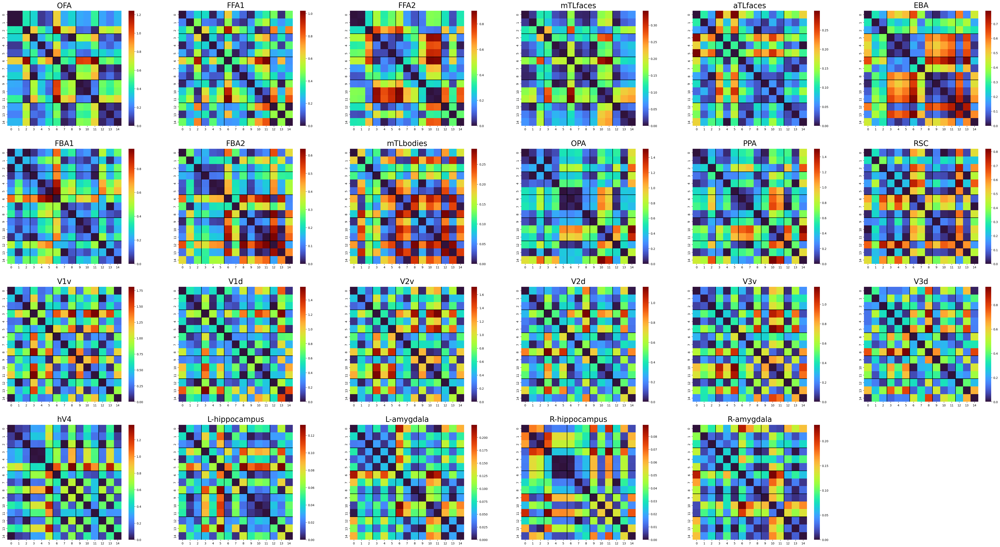

In [33]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]
plt.figure(figsize=(60, 32))

for roi, pos in zip(ROIs, fig_pos):
    ax = plt.subplot2grid((4,6), pos)
    sns.heatmap(rdms_roi[roi], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(roi, fontsize=25, pad=10)

In [34]:
for k_roi in rdms_roi.keys():
    upper_tri_indices = np.triu_indices_from(rdms_roi[k_roi], k=1)
    rdm_roi = rdms_roi[k_roi][upper_tri_indices]
    for k_dnn in dnn_keys:
        upper_tri_indices = np.triu_indices_from(rdms_dnn[k_dnn], k=1)
        rdm_dnn = rdms_dnn[k_dnn][upper_tri_indices]
        corr_coef, p_value = stats.spearmanr(rdm_roi, rdm_dnn)
        
        df_dict["memorability_modified"].append("original")
        df_dict["ROI"].append(k_roi)
        df_dict["DNN_layer"].append(k_dnn)
        df_dict["spearman_corr_coef"].append(corr_coef)
        df_dict["p_value"].append(p_value)

### Memorability-controlled: increased

In [35]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [36]:
high_image_data = image_data.copy()
for i, imfile in enumerate(high_imgs):
    nid = int(imfile.split("_")[0].split("shared")[-1])-1
    if nid in ctrld_nids:
        high_img = PIL.Image.open(ctrld_dir+"increased/"+imfile).convert("RGB").resize((227, 227))
        high_img = np.array(high_img, dtype=np.float32) / 255.
        high_image_data[nid] = high_img.transpose((2, 0, 1))

In [37]:
sampled_image_data = high_image_data[img_indices]
sampled_image_data.shape

(15, 3, 227, 227)

In [38]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:14   ] of 15, voxels [     0:22    ] of 23
---------------------------------------
total time = 0.025007s
sample throughput = 0.001667s/sample
voxel throughput = 0.001087s/voxel


(15, 23)

In [39]:
outputs = {}
rdms_dnn = {}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    rdms_dnn[k] = np.full((15, 15), np.nan)

MaxPool2d_0: (15, 64, 57, 57)
ReLU_1: (15, 64, 57, 57)
ReLU_2: (15, 64, 57, 57)
ReLU_3: (15, 128, 29, 29)
ReLU_4: (15, 128, 29, 29)
ReLU_5: (15, 256, 15, 15)
ReLU_6: (15, 256, 15, 15)
ReLU_7: (15, 512, 8, 8)
ReLU_8: (15, 512, 8, 8)
AdaptiveAvgPool2d_9: (15, 512, 1, 1)
Linear_10: (15, 1000)


In [40]:
# euclidean distance
for k, rdm in rdms_dnn.items():
    for i in range(15):
        i_concat = np.vstack([
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0)
        ])
        for j in range(15):  
            j_concat = np.vstack([
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0)
            ])
            rdm[i][j] = np.linalg.norm(i_concat-j_concat)

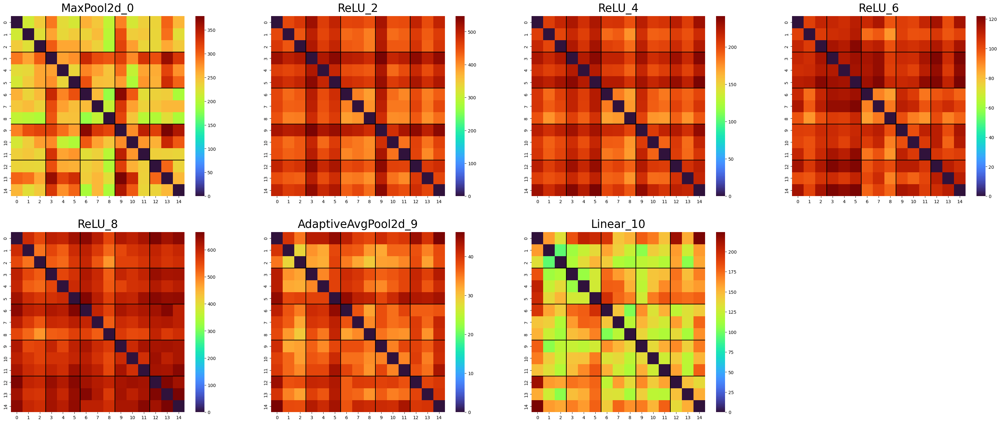

In [41]:
dnn_keys = ['MaxPool2d_0', 'ReLU_2', 'ReLU_4', 'ReLU_6', 'ReLU_8', 'AdaptiveAvgPool2d_9', 'Linear_10']
fig_pos = [(i, j) for i in range(2) for j in range(4)][:-1]
plt.figure(figsize=(40, 16))

for k, pos in zip(dnn_keys, fig_pos):
    ax = plt.subplot2grid((2,4), pos)
    sns.heatmap(rdms_dnn[k], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(k, fontsize=25, pad=10)

In [42]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {}
for roi in ROIs:
    rdms_roi[roi] = np.full((15, 15), np.nan)

In [43]:
for k, rdm in rdms_roi.items():
    roi_idx = list(ROIs).index(k)
    for i in range(15):
        i_sampled_roi = np.vstack([
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
        ])
        for j in range(15):
            j_sampled_roi = np.vstack([
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
            ])
            rdm[i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)

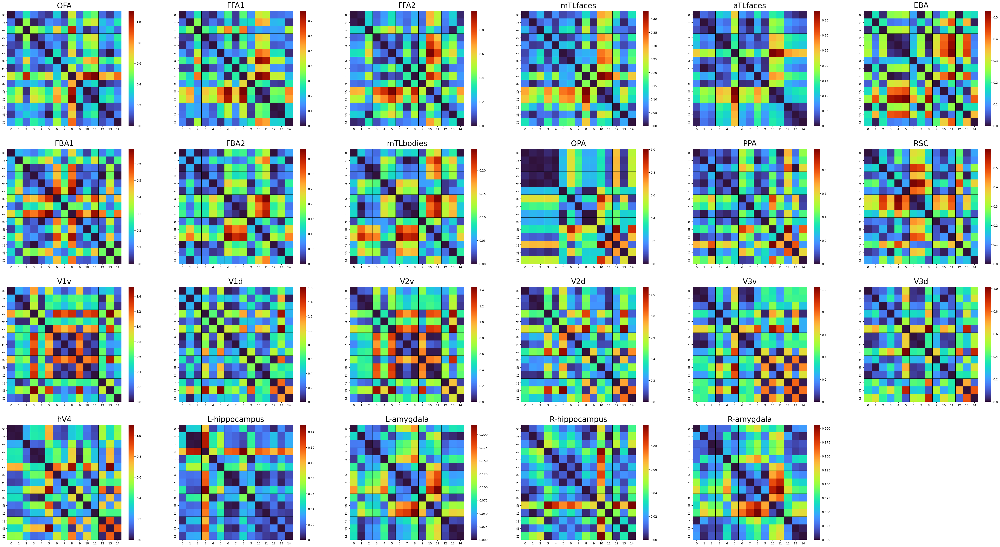

In [44]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]
plt.figure(figsize=(60, 32))

for roi, pos in zip(ROIs, fig_pos):
    ax = plt.subplot2grid((4,6), pos)
    sns.heatmap(rdms_roi[roi], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(roi, fontsize=25, pad=10)

In [45]:
for k_roi in rdms_roi.keys():
    upper_tri_indices = np.triu_indices_from(rdms_roi[k_roi], k=1)
    rdm_roi = rdms_roi[k_roi][upper_tri_indices]
    for k_dnn in dnn_keys:
        upper_tri_indices = np.triu_indices_from(rdms_dnn[k_dnn], k=1)
        rdm_dnn = rdms_dnn[k_dnn][upper_tri_indices]
        corr_coef, p_value = stats.spearmanr(rdm_roi, rdm_dnn)
        
        df_dict["memorability_modified"].append("increased")
        df_dict["ROI"].append(k_roi)
        df_dict["DNN_layer"].append(k_dnn)
        df_dict["spearman_corr_coef"].append(corr_coef)
        df_dict["p_value"].append(p_value)

### Memorability-controlled: decreased

In [46]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [47]:
low_image_data = image_data.copy()
for i, imfile in enumerate(low_imgs):
    nid = int(imfile.split("_")[0].split("shared")[-1])-1
    if nid in ctrld_nids:
        low_img = PIL.Image.open(ctrld_dir+"decreased/"+imfile).convert("RGB").resize((227, 227))
        low_img = np.array(low_img, dtype=np.float32) / 255.
        low_image_data[nid] = low_img.transpose((2, 0, 1))

In [48]:
sampled_image_data = low_image_data[img_indices]
sampled_image_data.shape

(15, 3, 227, 227)

In [49]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:14   ] of 15, voxels [     0:22    ] of 23
---------------------------------------
total time = 0.022230s
sample throughput = 0.001482s/sample
voxel throughput = 0.000967s/voxel


(15, 23)

In [50]:
outputs = {}
rdms_dnn = {}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    rdms_dnn[k] = np.full((15, 15), np.nan)

MaxPool2d_0: (15, 64, 57, 57)
ReLU_1: (15, 64, 57, 57)
ReLU_2: (15, 64, 57, 57)
ReLU_3: (15, 128, 29, 29)
ReLU_4: (15, 128, 29, 29)
ReLU_5: (15, 256, 15, 15)
ReLU_6: (15, 256, 15, 15)
ReLU_7: (15, 512, 8, 8)
ReLU_8: (15, 512, 8, 8)
AdaptiveAvgPool2d_9: (15, 512, 1, 1)
Linear_10: (15, 1000)


In [51]:
# euclidean distance
for k, rdm in rdms_dnn.items():
    for i in range(15):
        i_concat = np.vstack([
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0),
            np.expand_dims(outputs[k][i], axis=0)
        ])
        for j in range(15):  
            j_concat = np.vstack([
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0),
                np.expand_dims(outputs[k][j], axis=0)
            ])
            rdm[i][j] = np.linalg.norm(i_concat-j_concat)

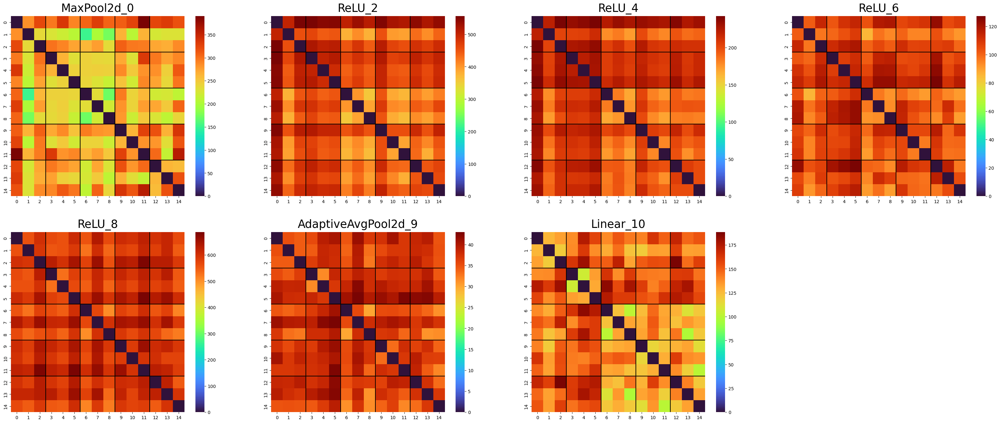

In [52]:
dnn_keys = ['MaxPool2d_0', 'ReLU_2', 'ReLU_4', 'ReLU_6', 'ReLU_8', 'AdaptiveAvgPool2d_9', 'Linear_10']
fig_pos = [(i, j) for i in range(2) for j in range(4)][:-1]
plt.figure(figsize=(40, 16))

for k, pos in zip(dnn_keys, fig_pos):
    ax = plt.subplot2grid((2,4), pos)
    sns.heatmap(rdms_dnn[k], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(k, fontsize=25, pad=10)

In [53]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {}
for roi in ROIs:
    rdms_roi[roi] = np.full((15, 15), np.nan)

In [54]:
for k, rdm in rdms_roi.items():
    roi_idx = list(ROIs).index(k)
    for i in range(15):
        i_sampled_roi = np.vstack([
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
            np.expand_dims(voxel_pred[i, roi_idx], axis=0),
        ])
        for j in range(15):
            j_sampled_roi = np.vstack([
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
                np.expand_dims(voxel_pred[j, roi_idx], axis=0),
            ])
            rdm[i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)

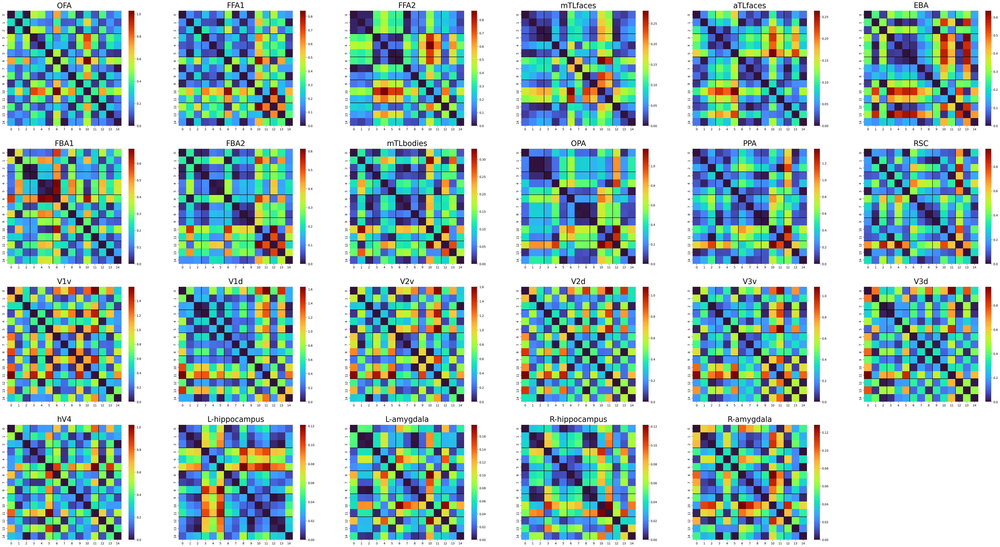

In [55]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]
plt.figure(figsize=(60, 32))

for roi, pos in zip(ROIs, fig_pos):
    ax = plt.subplot2grid((4,6), pos)
    sns.heatmap(rdms_roi[roi], ax=ax, cmap='turbo')
    ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
    ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
    plt.title(roi, fontsize=25, pad=10)

In [56]:
for k_roi in rdms_roi.keys():
    upper_tri_indices = np.triu_indices_from(rdms_roi[k_roi], k=1)
    rdm_roi = rdms_roi[k_roi][upper_tri_indices]
    for k_dnn in dnn_keys:
        upper_tri_indices = np.triu_indices_from(rdms_dnn[k_dnn], k=1)
        rdm_dnn = rdms_dnn[k_dnn][upper_tri_indices]
        corr_coef, p_value = stats.spearmanr(rdm_roi, rdm_dnn)
        
        df_dict["memorability_modified"].append("decreased")
        df_dict["ROI"].append(k_roi)
        df_dict["DNN_layer"].append(k_dnn)
        df_dict["spearman_corr_coef"].append(corr_coef)
        df_dict["p_value"].append(p_value)

### Check results

In [57]:
df = pd.DataFrame(df_dict)
print(df.shape)
df.head()

(644, 5)


,memorability_modified,ROI,DNN_layer,spearman_corr_coef,p_value
0,original_brain,OFA,MaxPool2d_0,0.286958,0.002998
1,original_brain,OFA,ReLU_2,0.101617,0.302318
2,original_brain,OFA,ReLU_4,0.032708,0.740469
3,original_brain,OFA,ReLU_6,-0.031682,0.748337
4,original_brain,OFA,ReLU_8,0.219708,0.024324


In [58]:
corr_cut = 0.4
p_cut = 0.05

In [59]:
mem_controlled = "original_brain"
df[(df["memorability_modified"] == mem_controlled) & (df["spearman_corr_coef"] > corr_cut) & (df["p_value"] < p_cut)]

,memorability_modified,ROI,DNN_layer,spearman_corr_coef,p_value
89,original_brain,V1v,AdaptiveAvgPool2d_9,0.444941,1.979277e-06
102,original_brain,V2v,ReLU_8,0.443521,2.152500e-06
103,original_brain,V2v,AdaptiveAvgPool2d_9,0.581889,7.515762e-11
104,original_brain,V2v,Linear_10,0.459258,8.315705e-07
116,original_brain,V3v,ReLU_8,0.412627,1.219376e-05
123,original_brain,V3d,ReLU_8,0.405215,1.803379e-05


In [60]:
mem_controlled = "original"
df[(df["memorability_modified"] == mem_controlled) & (df["spearman_corr_coef"] > corr_cut) & (df["p_value"] < p_cut)]

,memorability_modified,ROI,DNN_layer,spearman_corr_coef,p_value
190,original,aTLfaces,ReLU_2,0.427141,5.514378e-06
191,original,aTLfaces,ReLU_4,0.501970,4.886353e-08
192,original,aTLfaces,ReLU_6,0.465125,5.761517e-07
194,original,aTLfaces,AdaptiveAvgPool2d_9,0.581267,7.959142e-11
195,original,aTLfaces,Linear_10,0.646931,8.944813e-14
270,original,V2d,ReLU_8,0.403628,1.958544e-05
271,original,V2d,AdaptiveAvgPool2d_9,0.413353,1.172956e-05
272,original,V2d,Linear_10,0.401161,2.225015e-05
293,original,hV4,Linear_10,0.407008,1.641857e-05
298,original,L-hippocampus,ReLU_8,0.492131,9.717024e-08


In [61]:
mem_controlled = "increased"
df[(df["memorability_modified"] == mem_controlled) & (df["spearman_corr_coef"] > corr_cut) & (df["p_value"] < p_cut)]

,memorability_modified,ROI,DNN_layer,spearman_corr_coef,p_value
389,increased,OPA,ReLU_8,0.430697,4.514424e-06
396,increased,PPA,ReLU_8,0.419034,8.629128e-06
406,increased,V1v,MaxPool2d_0,0.515665,1.808963e-08
407,increased,V1v,ReLU_2,0.489436,1.168702e-07
456,increased,L-hippocampus,ReLU_2,0.508853,2.981504e-08
457,increased,L-hippocampus,ReLU_4,0.420174,8.108010e-06


In [62]:
mem_controlled = "decreased"
df[(df["memorability_modified"] == mem_controlled) & (df["spearman_corr_coef"] > corr_cut) & (df["p_value"] < p_cut)]

,memorability_modified,ROI,DNN_layer,spearman_corr_coef,p_value
516,decreased,aTLfaces,AdaptiveAvgPool2d_9,0.428851,0.000005
517,decreased,aTLfaces,Linear_10,0.452343,0.000001


In [63]:
df.to_csv("data/memorability_controlled_test_70p/including_memory/resnet/rsa_dnn_dnn.csv", index=False)

## Brain-DNN

In [7]:
df_memorability = pd.read_csv("data/shared1000_imagenetclass_memorability.csv")
print(df_memorability.shape)
df_memorability.head()

(1000, 6)


,nid,memorability,filename,imagenet_class_idx,imagenet_class_str,imagenet_class_confidence
0,0,0.650298,shared0001_nsd02951.png,582,grocery store,0.904114
1,1,0.616680,shared0002_nsd02991.png,909,wok,0.393054
2,2,0.542597,shared0003_nsd03050.png,842,swimming trunks,0.449821
3,3,0.705648,shared0004_nsd03078.png,484,catamaran,0.764963
4,4,0.609077,shared0005_nsd03147.png,497,church,0.818826


In [9]:
memorability_midl = df_memorability["memorability"].quantile(0.45)
memorability_midr = df_memorability["memorability"].quantile(0.55)
memorability_high = df_memorability["memorability"].quantile(1-0.1)
memorability_low = df_memorability["memorability"].quantile(0.1)
print(f"memorability_high: {memorability_high}, memorability_low: {memorability_low}")

nid_mids = df_memorability[(df_memorability["memorability"] > memorability_midl) & (df_memorability["memorability"] < memorability_midr)]["nid"].values.tolist()    
nid_highs = df_memorability[df_memorability["memorability"] > memorability_high]["nid"].values.tolist()
nid_lows = df_memorability[df_memorability["memorability"] < memorability_low]["nid"].values.tolist()

memorability_high: 0.8059463832855226, memorability_low: 0.4206980441093446


In [10]:
df_dict = {
    "subject": [],
    "memorable": [],
    "ROI": [],
    "DNN_layer": [],
    "pearson-pearson": [], # Conwell et al., 2022 (cRSA)
    "pearson-pearson_p": [],
    "euclidean-spearman": [], # Xu & Vaziri-Pashkam, 2021 (main)
    "euclidean-spearman_p": [],
    "euclidean-pearson": [], # Xu & Vaziri-Pashkam, 2021 (supplemenatry)
    "euclidean-pearson_p": [],
    "pearson-spearman": [], # Xu & Vaziri-Pashkam, 2021 (supplemenatry)
    "pearson-spearman_p": []
}

In [11]:
stim_num = 100

### Load subject

In [10]:
# parameters
subject = 3

# subj_dir = ctrld_dir+f"subj{subject:02d}/"
subj_dir = ctrld_dir+f"including_memory/resnet/subj{subject:02d}/"
os.makedirs(subj_dir, exist_ok=True)

In [11]:
# load behavior data

exp_design = loadmat(exp_design_file)
# order of image id in trials
ordering = exp_design['masterordering'].flatten() - 1 # zero-indexed ordering of indices (matlab-like to python-like)
print('ordering shape', ordering.shape)
# image id for each subject
subject_idx  = exp_design['subjectim']
print('subject_idx shape', subject_idx.shape)
# shared image id
shared_idx = exp_design['sharedix']

ordering shape (30000,)
subject_idx shape (8, 10000)


In [12]:
image_data = np.load("data/nsd/shared1000_227.npy")
image_data = image_data.astype(np.float32) / 255.

print('image data shape', image_data.shape)

image data shape (1000, 3, 227, 227)


In [13]:
data_size = trials[subject-1]
ordering_data = ordering[:data_size]
print(ordering_data.shape)

(24000,)


In [14]:
roi_num = len(default_ROIs)
roi_data = np.zeros([data_size, roi_num])
n = 0
del_idx = []
for roi in default_ROIs:
    roi_data[:,n] = np.genfromtxt(meanROIbeta_root + f'subj{subject:02d}/meanbeta_' + roi + '.txt')
    if np.isnan(np.sum(roi_data[:,n])):
        print(roi)
        del_idx.append(n)
    n += 1

ROIs_bool = np.ones((23,1), dtype='bool')
ROIs_bool[del_idx] = False

roi_data = np.delete(roi_data, del_idx, axis=1)

mTLfaces
mTLbodies


In [17]:
print(roi_data[np.in1d(ordering_data, nid_mids)].shape)
print(roi_data[np.in1d(ordering_data, nid_highs)].shape)
print(roi_data[np.in1d(ordering_data, nid_lows)].shape)

(232, 21)
(237, 21)
(240, 21)


In [18]:
list(range(1, 9))

[1, 2, 3, 4, 5, 6, 7, 8]

### More memorable images

In [98]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [99]:
# plt.imshow(np.expand_dims(image_data[ctrld_nids[0]], axis=0)[0].transpose(1, 2, 0))

In [100]:
sampled_image_data = image_data[nid_highs]
sampled_image_data.shape

(100, 3, 227, 227)

In [101]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:99   ] of 100, voxels [     0:20    ] of 21
---------------------------------------
total time = 0.060328s
sample throughput = 0.000603s/sample
voxel throughput = 0.002873s/voxel


(100, 21)

In [102]:
outputs = {}
rdms_dnn = {
    "euclidean": {},
    "pearson": {}
}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    for method in rdms_dnn.keys():
        rdms_dnn[method][k] = np.full((stim_num, stim_num), np.nan)

dnn_keys = list(outputs.keys())

MaxPool2d_0: (100, 64, 57, 57)
ReLU_1: (100, 64, 57, 57)
ReLU_2: (100, 64, 57, 57)
ReLU_3: (100, 128, 29, 29)
ReLU_4: (100, 128, 29, 29)
ReLU_5: (100, 256, 15, 15)
ReLU_6: (100, 256, 15, 15)
ReLU_7: (100, 512, 8, 8)
ReLU_8: (100, 512, 8, 8)
AdaptiveAvgPool2d_9: (100, 512, 1, 1)
Linear_10: (100, 1000)


In [103]:
for k in dnn_keys:
    for i in range(stim_num):
        for j in range(stim_num):
            rdms_dnn["euclidean"][k][i][j] = np.linalg.norm(outputs[k][i]-outputs[k][j])
            rdms_dnn["pearson"][k][i][j], _ = stats.pearsonr(np.ravel(outputs[k][i]), np.ravel(outputs[k][j]))

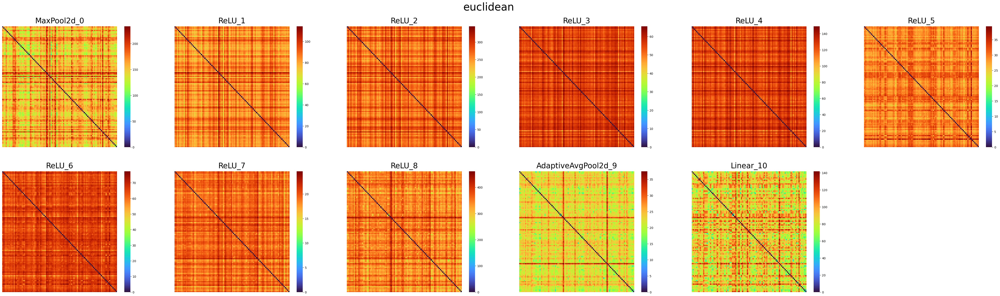

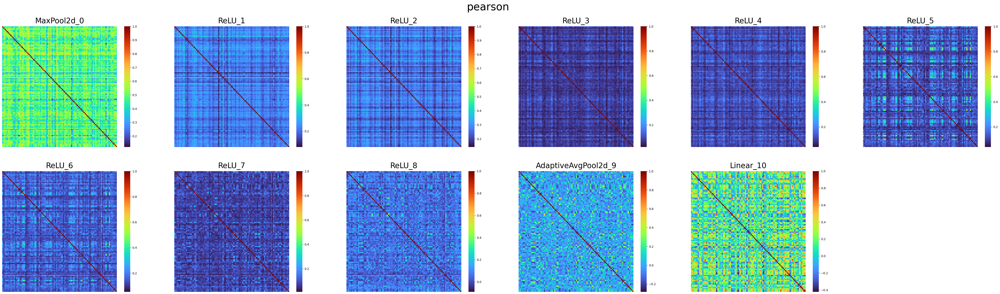

In [104]:
fig_pos = [(i, j) for i in range(2) for j in range(6)][:-1]

for method in rdms_dnn.keys():
    plt.figure(figsize=(60, 16))
    for k, pos in zip(dnn_keys, fig_pos):
        ax = plt.subplot2grid((2,6), pos)
        sns.heatmap(rdms_dnn[method][k], ax=ax, cmap='turbo')
        # ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
        # ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(k, fontsize=25, pad=10)
    plt.suptitle(method, fontsize=35, y=0.95)
    plt.savefig(save_dir+f"S{subject:02d}_DNN_RDMs_{method}_more_10p.png", bbox_inches="tight")

In [105]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {
    "euclidean": {},
    "pearson": {}
}
for roi in ROIs:
    for method in rdms_roi.keys():
        rdms_roi[method][roi] = np.full((stim_num, stim_num), np.nan)

In [106]:
for roi in ROIs:
    roi_idx = list(ROIs).index(roi)
    for i, i_img_idx in enumerate(nid_highs):
        i_sampled_roi = roi_data[np.in1d(ordering_data, i_img_idx)][:, roi_idx]
        for j, j_img_idx in enumerate(nid_highs):
            j_sampled_roi = roi_data[np.in1d(ordering_data, j_img_idx)][:, roi_idx]
            
            rdms_roi["euclidean"][roi][i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)
            rdms_roi["pearson"][roi][i][j], _ = stats.pearsonr(np.ravel(i_sampled_roi), np.ravel(j_sampled_roi))

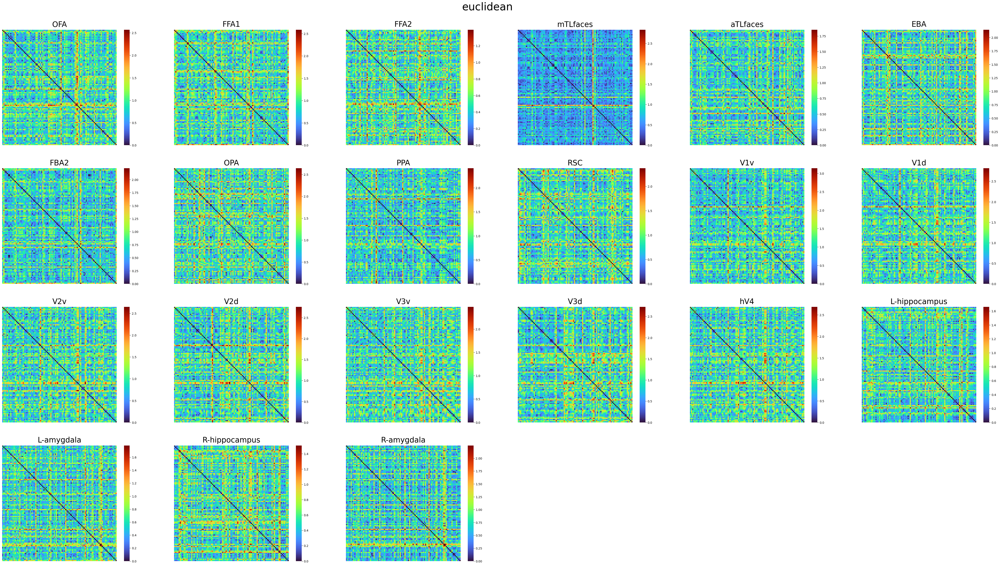

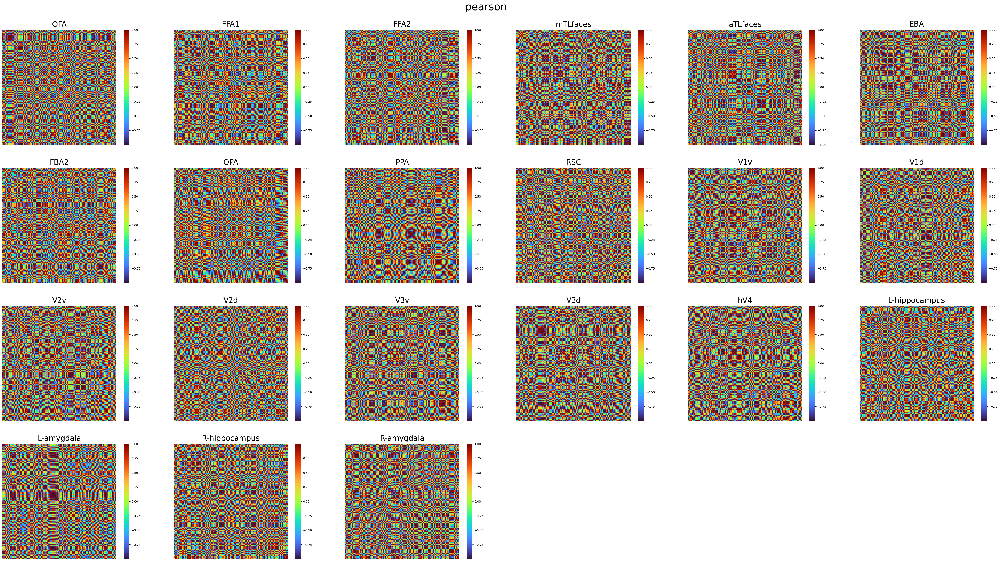

In [107]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]

for method in rdms_roi.keys():
    plt.figure(figsize=(60, 32))
    for roi, pos in zip(ROIs, fig_pos):
        ax = plt.subplot2grid((4,6), pos)
        sns.heatmap(rdms_roi[method][roi], ax=ax, cmap='turbo')
        # ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
        # ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(roi, fontsize=25, pad=10)
    plt.suptitle(method, fontsize=35, y=0.92)
    plt.savefig(save_dir+f"S{subject:02d}_ROI_RDMs_{method}_more_10p.png", bbox_inches="tight")

In [108]:
for method in ["euclidean", "pearson"]:
    for k_roi in ROIs:
        upper_tri_indices = np.triu_indices_from(rdms_roi[method][k_roi], k=1)
        rdm_roi = rdms_roi[method][k_roi][upper_tri_indices]
        for k_dnn in dnn_keys:
            upper_tri_indices = np.triu_indices_from(rdms_dnn[method][k_dnn], k=1)
            rdm_dnn = rdms_dnn[method][k_dnn][upper_tri_indices]
            spearman_r, sparman_p = stats.spearmanr(rdm_roi, rdm_dnn)
            pearson_r, pearson_p = stats.pearsonr(rdm_roi, rdm_dnn)

            if method == "euclidean":
                df_dict["subject"].append(subject)
                df_dict["memorable"].append("more")
                df_dict["ROI"].append(k_roi)
                df_dict["DNN_layer"].append(k_dnn)
            
            df_dict[f"{method}-spearman"].append(spearman_r)
            df_dict[f"{method}-spearman_p"].append(sparman_p)
            df_dict[f"{method}-pearson"].append(pearson_r)
            df_dict[f"{method}-pearson_p"].append(pearson_p)

### Less memorable images

In [109]:
# load params
model_params_set = h5py.File(weight_root+f'S{subject:02d}/model_params.h5py' , 'r')
# model_params_set = h5py.File(weight_root+f'S{subject:02d}/dnn_fwrf/model_params.h5py' , 'r')
model_params = embed_dict({k: np.copy(d) for k,d in model_params_set.items()})
model_params_set.close()

# load encoding models
fwrf, fmaps = load_encoding(model_params, fmap_name=model_name, device=device)

/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/hhan228/memorability-experiment-pipeline/venv/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [110]:
# plt.imshow(np.expand_dims(image_data[ctrld_nids[0]], axis=0)[0].transpose(1, 2, 0))

In [111]:
sampled_image_data = image_data[nid_lows]
sampled_image_data.shape

(100, 3, 227, 227)

In [112]:
# predict brain response
voxel_pred = get_predictions(sampled_image_data, fmaps, fwrf, model_params['params'])
voxel_pred.shape

samples [    0:99   ] of 100, voxels [     0:20    ] of 21
---------------------------------------
total time = 0.054186s
sample throughput = 0.000542s/sample
voxel throughput = 0.002580s/voxel


(100, 21)

In [113]:
outputs = {}
rdms_dnn = {
    "euclidean": {},
    "pearson": {}
}
for k in fmaps.fmaps.extractor.outputs.keys():
    outputs[k] = fmaps.fmaps.extractor.outputs[k].cpu().numpy()
    print(f"{k}: {outputs[k].shape}")
    for method in rdms_dnn.keys():
        rdms_dnn[method][k] = np.full((stim_num, stim_num), np.nan)

dnn_keys = list(outputs.keys())

MaxPool2d_0: (100, 64, 57, 57)
ReLU_1: (100, 64, 57, 57)
ReLU_2: (100, 64, 57, 57)
ReLU_3: (100, 128, 29, 29)
ReLU_4: (100, 128, 29, 29)
ReLU_5: (100, 256, 15, 15)
ReLU_6: (100, 256, 15, 15)
ReLU_7: (100, 512, 8, 8)
ReLU_8: (100, 512, 8, 8)
AdaptiveAvgPool2d_9: (100, 512, 1, 1)
Linear_10: (100, 1000)


In [114]:
for k in dnn_keys:
    for i in range(stim_num):
        for j in range(stim_num):
            rdms_dnn["euclidean"][k][i][j] = np.linalg.norm(outputs[k][i]-outputs[k][j])
            rdms_dnn["pearson"][k][i][j], _ = stats.pearsonr(np.ravel(outputs[k][i]), np.ravel(outputs[k][j]))

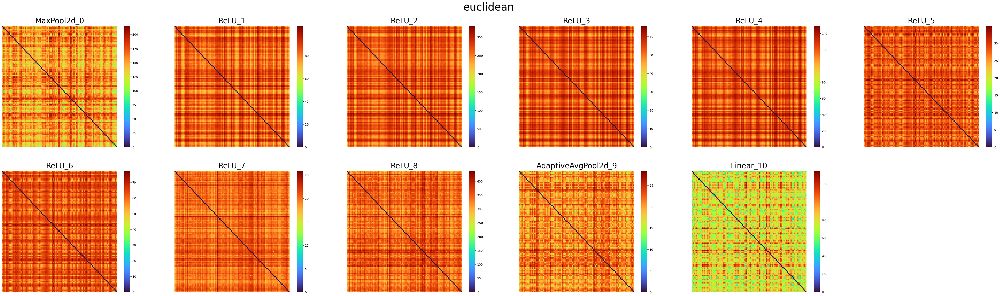

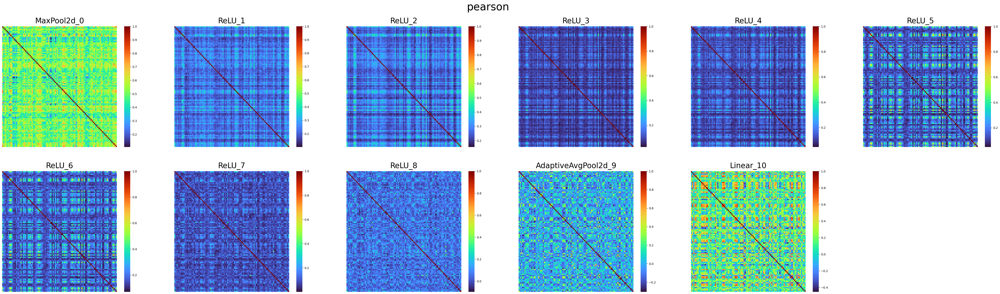

In [115]:
fig_pos = [(i, j) for i in range(2) for j in range(6)][:-1]

for method in rdms_dnn.keys():
    plt.figure(figsize=(60, 16))
    for k, pos in zip(dnn_keys, fig_pos):
        ax = plt.subplot2grid((2,6), pos)
        sns.heatmap(rdms_dnn[method][k], ax=ax, cmap='turbo')
        # ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
        # ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(k, fontsize=25, pad=10)
    plt.suptitle(method, fontsize=35, y=0.95)
    plt.savefig(save_dir+f"S{subject:02d}_DNN_RDMs_{method}_less_10p.png", bbox_inches="tight")

In [116]:
ROIs = np.delete(default_ROIs, del_idx) 

rdms_roi = {
    "euclidean": {},
    "pearson": {}
}
for roi in ROIs:
    for method in rdms_roi.keys():
        rdms_roi[method][roi] = np.full((stim_num, stim_num), np.nan)

In [117]:
for roi in ROIs:
    roi_idx = list(ROIs).index(roi)
    for i, i_img_idx in enumerate(nid_highs):
        i_sampled_roi = roi_data[np.in1d(ordering_data, i_img_idx)][:, roi_idx]
        for j, j_img_idx in enumerate(nid_highs):
            j_sampled_roi = roi_data[np.in1d(ordering_data, j_img_idx)][:, roi_idx]
            
            rdms_roi["euclidean"][roi][i][j] = np.linalg.norm(i_sampled_roi-j_sampled_roi)
            rdms_roi["pearson"][roi][i][j], _ = stats.pearsonr(np.ravel(i_sampled_roi), np.ravel(j_sampled_roi))

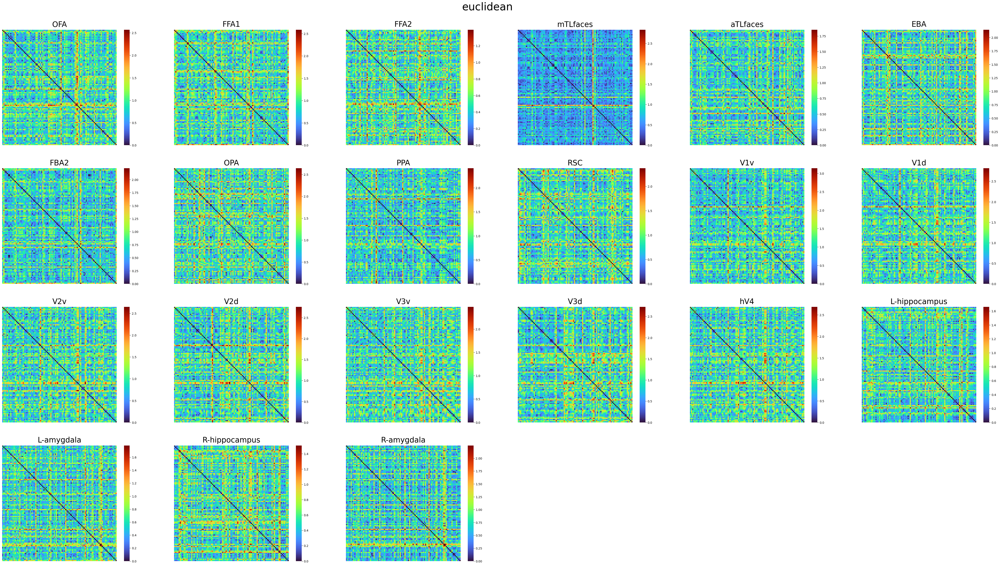

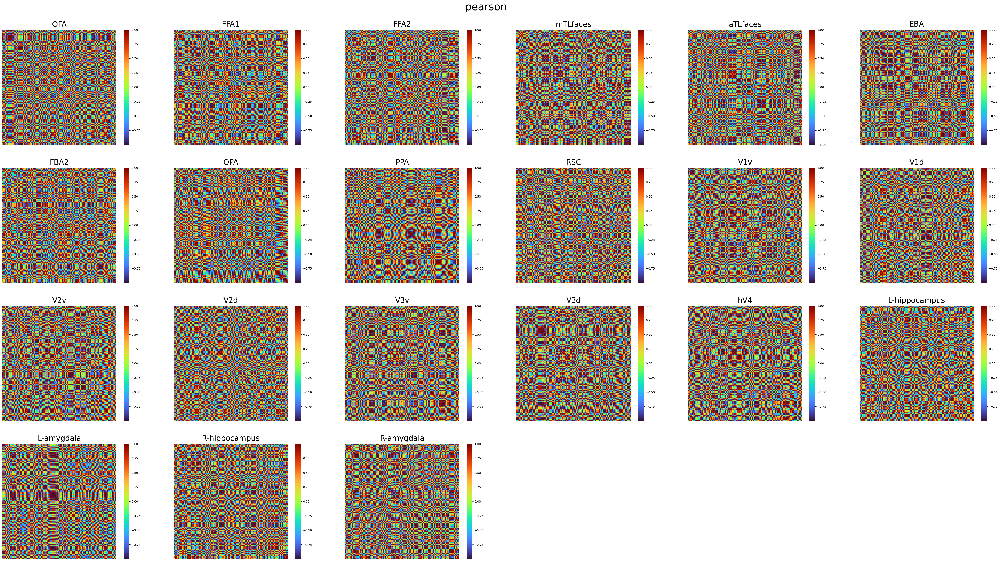

In [118]:
fig_pos = [(i, j) for i in range(4) for j in range(6)][:-1]

for method in rdms_roi.keys():
    plt.figure(figsize=(60, 32))
    for roi, pos in zip(ROIs, fig_pos):
        ax = plt.subplot2grid((4,6), pos)
        sns.heatmap(rdms_roi[method][roi], ax=ax, cmap='turbo')
        # ax.hlines([3, 6, 9, 12], *ax.get_xlim(), colors='black')
        # ax.vlines([3, 6, 9, 12], *ax.get_ylim(), colors='black')
        ax.set_xticks([])
        ax.set_yticks([])
        plt.title(roi, fontsize=25, pad=10)
    plt.suptitle(method, fontsize=35, y=0.92)
    plt.savefig(save_dir+f"S{subject:02d}_ROI_RDMs_{method}_less_10p.png", bbox_inches="tight")

In [119]:
for method in ["euclidean", "pearson"]:
    for k_roi in ROIs:
        upper_tri_indices = np.triu_indices_from(rdms_roi[method][k_roi], k=1)
        rdm_roi = rdms_roi[method][k_roi][upper_tri_indices]
        for k_dnn in dnn_keys:
            upper_tri_indices = np.triu_indices_from(rdms_dnn[method][k_dnn], k=1)
            rdm_dnn = rdms_dnn[method][k_dnn][upper_tri_indices]
            spearman_r, sparman_p = stats.spearmanr(rdm_roi, rdm_dnn)
            pearson_r, pearson_p = stats.pearsonr(rdm_roi, rdm_dnn)

            if method == "euclidean":
                df_dict["subject"].append(subject)
                df_dict["memorable"].append("less")
                df_dict["ROI"].append(k_roi)
                df_dict["DNN_layer"].append(k_dnn)
            
            df_dict[f"{method}-spearman"].append(spearman_r)
            df_dict[f"{method}-spearman_p"].append(sparman_p)
            df_dict[f"{method}-pearson"].append(pearson_r)
            df_dict[f"{method}-pearson_p"].append(pearson_p)

### Save results

In [120]:
df = pd.DataFrame(df_dict)
print(df.shape)
df.head()

(1870, 12)


,subject,memorable,ROI,DNN_layer,pearson-pearson,pearson-pearson_p,euclidean-spearman,euclidean-spearman_p,euclidean-pearson,euclidean-pearson_p,pearson-spearman,pearson-spearman_p
0,1,more,OFA,MaxPool2d_0,0.004260,0.764471,-0.066064,3.288568e-06,-0.069509,9.825824e-07,-0.000373,0.979046
1,1,more,OFA,ReLU_1,-0.001151,0.935496,-0.060649,1.955699e-05,-0.061289,1.595715e-05,-0.004457,0.753877
2,1,more,OFA,ReLU_2,0.002465,0.862342,-0.069929,8.447166e-07,-0.079514,2.121745e-08,0.001317,0.926204
3,1,more,OFA,ReLU_3,0.008026,0.572405,-0.069060,1.153801e-06,-0.074265,1.686544e-07,0.009279,0.513981
4,1,more,OFA,ReLU_4,0.008102,0.568747,-0.054738,1.166279e-04,-0.060559,2.012164e-05,0.012564,0.376823


In [121]:
df.to_csv(save_dir+"rsa_brain_dnn_10p.csv", index=False)